# **Debutanizer Column**
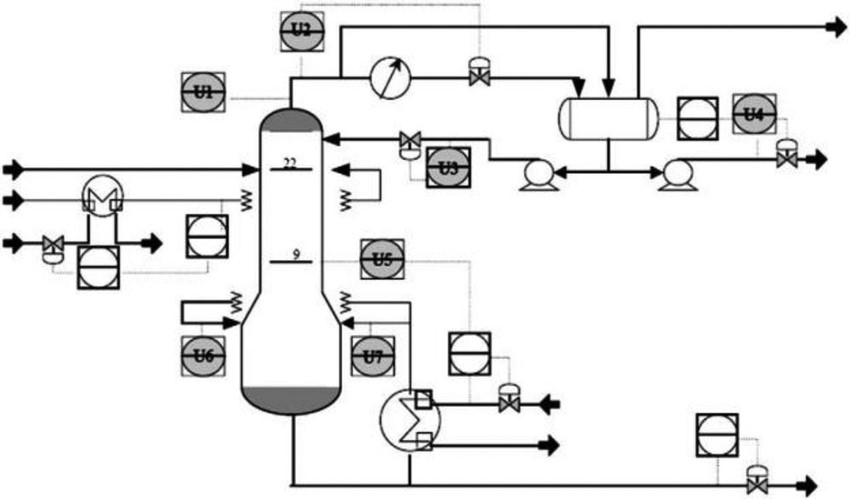

 The main targert is to minimize the butane (CH4) content in the bottom output of the Debutanizer column i.e the Naptha Splitter Feed.

We have 7 variables.
1. U_1 = Top Temperature
2. U_2 = Top Pressure
3. U_3 = Reflux Flow
4. U_4 = Flow to Next Process
5. U_5 = 6TH Tray Temperature
6. U_6 = Bottom Temperature
7. U_7 = Bottom Temperature

### The Final Target Variable is the Butane(CH4) Content in the bottom of Debutanizer ***Y***.

# Importing required libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math

# Importing data

In [3]:
dataset=pd.read_csv("Debutanizer data.csv")

In [4]:
dataset

,u1,u2,u3,u4,u5,u6,u7,y
0,0.268900,0.650894,0.832742,0.583420,0.784759,0.843079,0.822079,0.180295
1,0.268483,0.650140,0.852153,0.577510,0.776487,0.838605,0.822079,0.177124
2,0.267967,0.659657,0.823618,0.571600,0.764546,0.807879,0.786246,0.173618
3,0.267451,0.668338,0.808371,0.565689,0.752605,0.799606,0.786246,0.171640
4,0.266935,0.647191,0.761948,0.559779,0.745326,0.773122,0.746142,0.166972
...,...,...,...,...,...,...,...,...
2389,0.284859,0.645894,0.688723,0.355109,0.615583,0.608848,0.500866,0.188976
2390,0.266139,0.665503,0.665640,0.354275,0.588834,0.582074,0.508999,0.178992
2391,0.247419,0.665706,0.664740,0.353441,0.561301,0.602186,0.523348,0.169742
2392,0.228699,0.672975,0.677300,0.352607,0.530730,0.636970,0.537697,0.159023


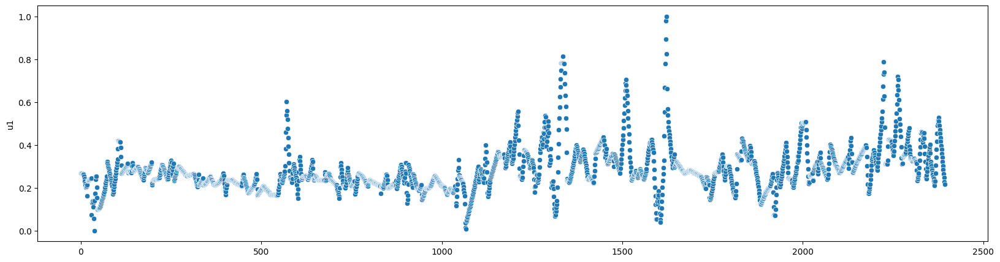

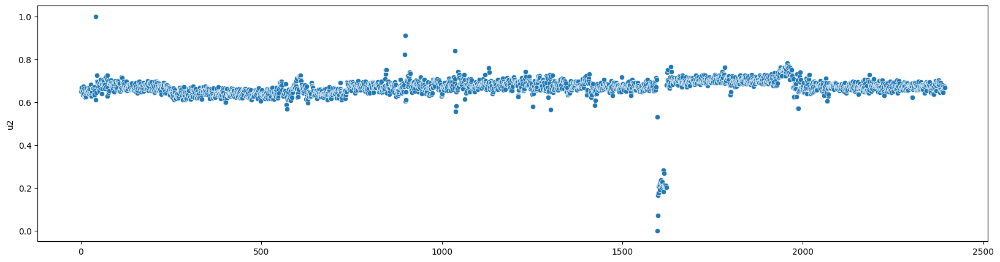

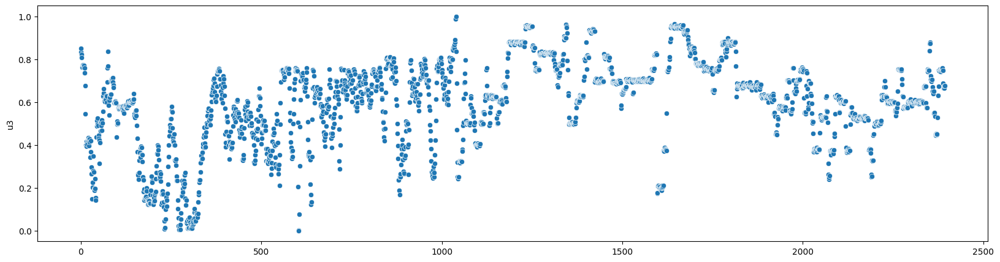

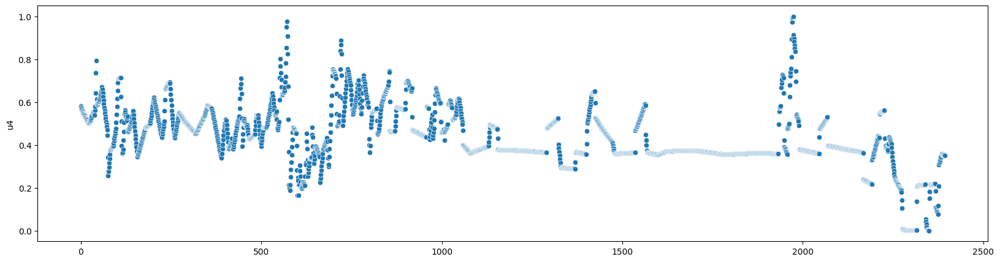

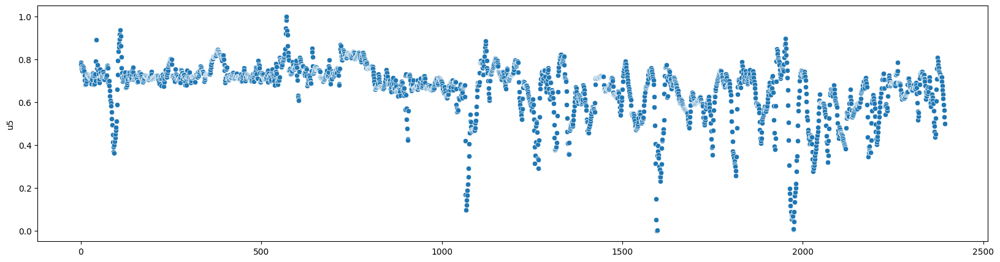

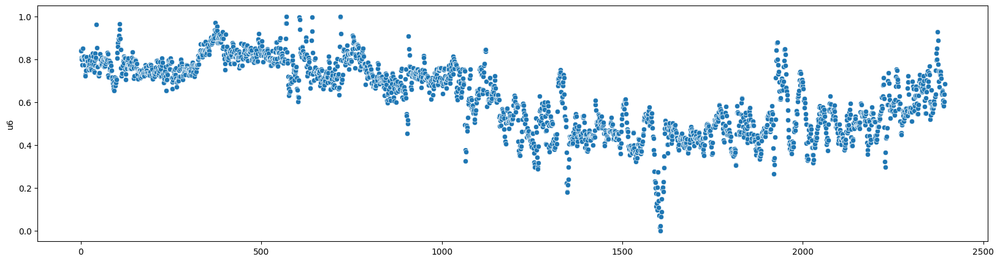

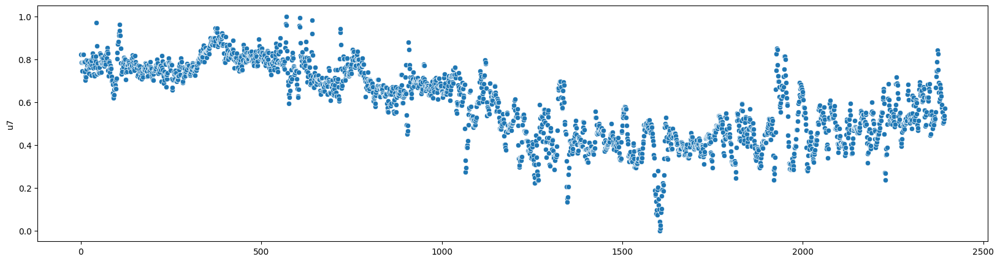

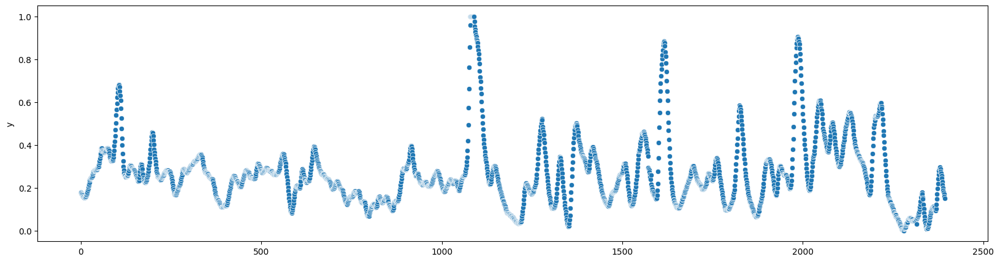

In [5]:
import seaborn as sns
feature_names=dataset['u1'],dataset['u2'],dataset['u3'],dataset['u4'],dataset['u5'],dataset['u6'],dataset['u7'],dataset['y'],
for feature in feature_names:
    plt.figure(figsize=(20, 5))
    sns.scatterplot(feature)

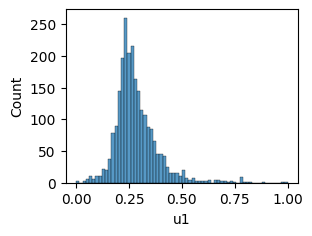

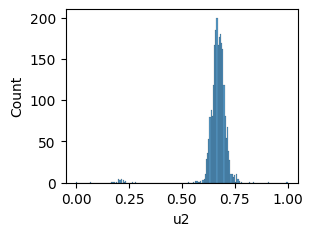

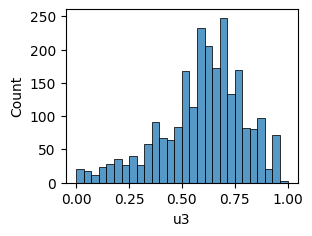

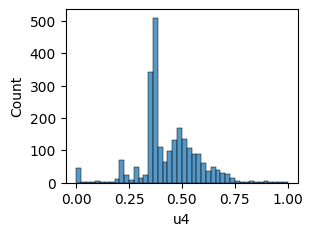

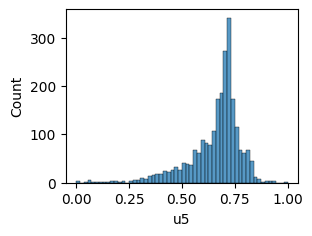

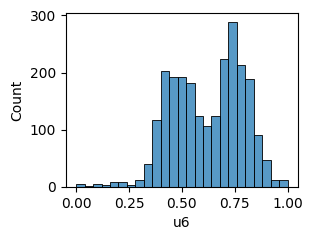

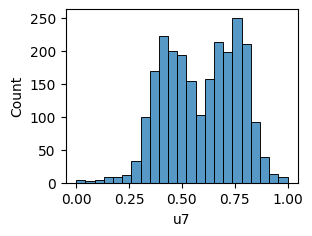

In [6]:
import seaborn as sns
feature_names=dataset['u1'],dataset['u2'],dataset['u3'],dataset['u4'],dataset['u5'],dataset['u6'],dataset['u7'],
for feature in feature_names:
    plt.figure(figsize=(3, 2.25))
    sns.histplot(feature)

In [7]:
dataset.info()
dataset.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2394 entries, 0 to 2393
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   u1      2394 non-null   float64
 1   u2      2394 non-null   float64
 2   u3      2394 non-null   float64
 3   u4      2394 non-null   float64
 4   u5      2394 non-null   float64
 5   u6      2394 non-null   float64
 6   u7      2394 non-null   float64
 7   y       2394 non-null   float64
dtypes: float64(8)
memory usage: 149.8 KB


,u1,u2,u3,u4,u5,u6,u7,y
count,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000
mean,0.283894,0.667847,0.598467,0.435948,0.658086,0.620741,0.589397,0.267788
std,0.103143,0.057690,0.198581,0.138237,0.127054,0.165116,0.173251,0.158943
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.224004,0.653819,0.500390,0.363369,0.608661,0.481804,0.445001,0.169188
50%,0.263995,0.671915,0.624269,0.396288,0.694644,0.639585,0.600959,0.246857
75%,0.325607,0.690943,0.742784,0.518144,0.730119,0.755050,0.741387,0.318061
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
dataset.corr()

,u1,u2,u3,u4,u5,u6,u7,y
u1,1.000000,0.022282,0.185203,-0.285688,0.264961,-0.133458,-0.127381,0.068679
u2,0.022282,1.000000,0.294438,-0.014677,0.056326,0.055273,0.019423,-0.210909
u3,0.185203,0.294438,1.000000,-0.135633,-0.037202,-0.334736,-0.389827,-0.248085
u4,-0.285688,-0.014677,-0.135633,1.000000,0.140631,0.344408,0.344012,0.149349
u5,0.264961,0.056326,-0.037202,0.140631,1.000000,0.690699,0.702230,-0.210236
u6,-0.133458,0.055273,-0.334736,0.344408,0.690699,1.000000,0.988595,-0.064930
u7,-0.127381,0.019423,-0.389827,0.344012,0.702230,0.988595,1.000000,-0.043576
y,0.068679,-0.210909,-0.248085,0.149349,-0.210236,-0.064930,-0.043576,1.000000


# Removing the Outliers

In [9]:
def outlier(x,dataset,i):
  for m in range(i):
    print (m)
    for n in range(len(x[:,0])):
      if (x[n][m]<(np.median(x[:,m]) - 3*np.std(x[:,m]))) or (x[n][m]>(np.median(x[:,m]) + 3*np.std(x[:,m]))):
        dataset.drop([n],inplace = True)
        dataset = dataset.reset_index(drop = True)
  return(dataset)

In [10]:
X = dataset.iloc[ : ,0:-1].values
Y = dataset.iloc[ : ,-1].values

In [11]:
dataset.describe()

,u1,u2,u3,u4,u5,u6,u7,y
count,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000,2394.000000
mean,0.283894,0.667847,0.598467,0.435948,0.658086,0.620741,0.589397,0.267788
std,0.103143,0.057690,0.198581,0.138237,0.127054,0.165116,0.173251,0.158943
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.224004,0.653819,0.500390,0.363369,0.608661,0.481804,0.445001,0.169188
50%,0.263995,0.671915,0.624269,0.396288,0.694644,0.639585,0.600959,0.246857
75%,0.325607,0.690943,0.742784,0.518144,0.730119,0.755050,0.741387,0.318061
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [12]:
dataset = outlier(X,dataset,7)
#dataset = outlier(Y,dataset,1)
for n in range(len(Y[:])):
      if (Y[n]<(np.median(Y[:]) - 3*np.std(Y[:]))) or (Y[n]>(np.median(Y[:]) + 3*np.std(Y[:]))):
        dataset.drop([n],inplace = True)
        dataset = dataset.reset_index(drop = True)
dataset.info()

0
1
2
3
4
5
6
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2148 entries, 0 to 2147
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   u1      2148 non-null   float64
 1   u2      2148 non-null   float64
 2   u3      2148 non-null   float64
 3   u4      2148 non-null   float64
 4   u5      2148 non-null   float64
 5   u6      2148 non-null   float64
 6   u7      2148 non-null   float64
 7   y       2148 non-null   float64
dtypes: float64(8)
memory usage: 134.4 KB


In [13]:
dataset.describe()

,u1,u2,u3,u4,u5,u6,u7,y
count,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000
mean,0.279805,0.666114,0.594160,0.441382,0.660092,0.629672,0.598171,0.267528
std,0.100174,0.059673,0.194826,0.139901,0.127829,0.165131,0.173750,0.158379
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.220619,0.652640,0.499138,0.363247,0.618587,0.491001,0.457163,0.171422
50%,0.259653,0.670519,0.622942,0.421411,0.697276,0.663597,0.626581,0.248040
75%,0.323743,0.690079,0.725745,0.525064,0.730288,0.760675,0.749166,0.316127
max,1.000000,0.911387,1.000000,1.000000,0.983421,1.000000,1.000000,1.000000


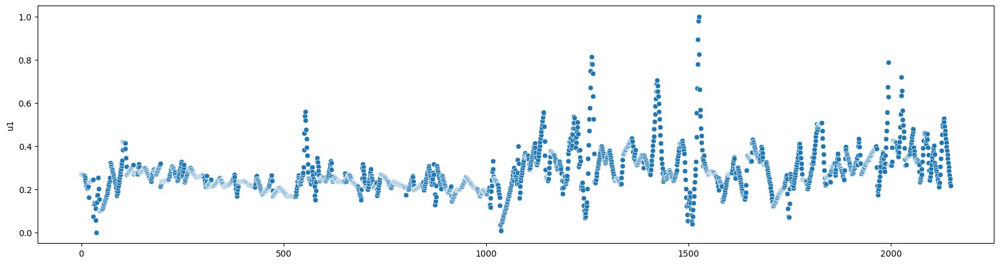

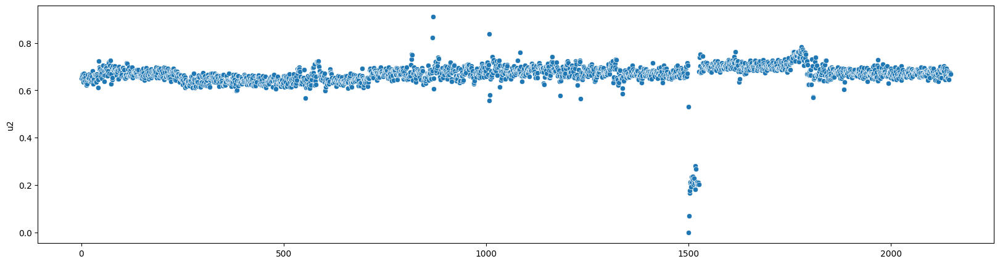

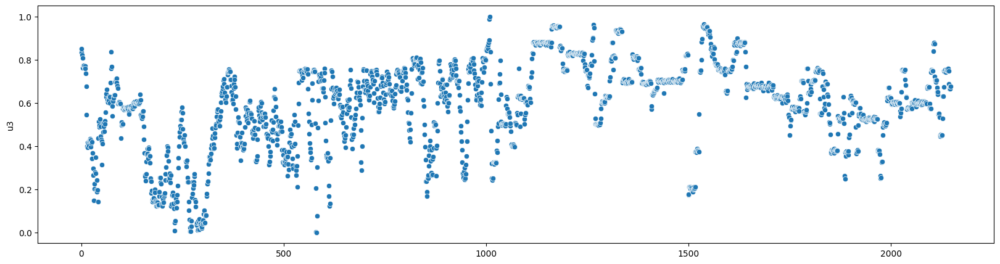

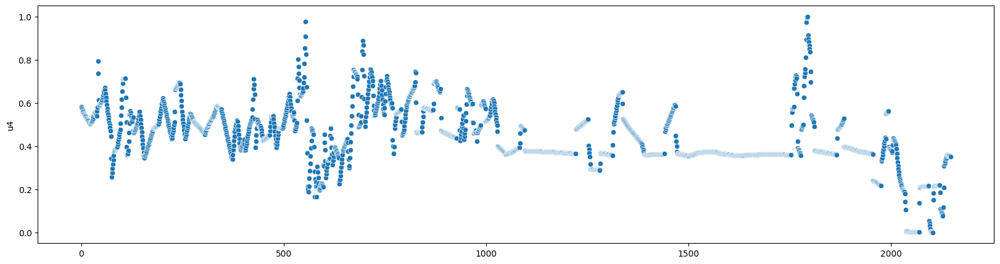

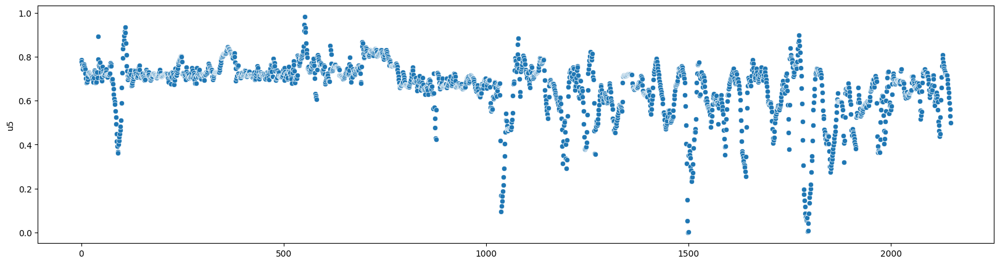

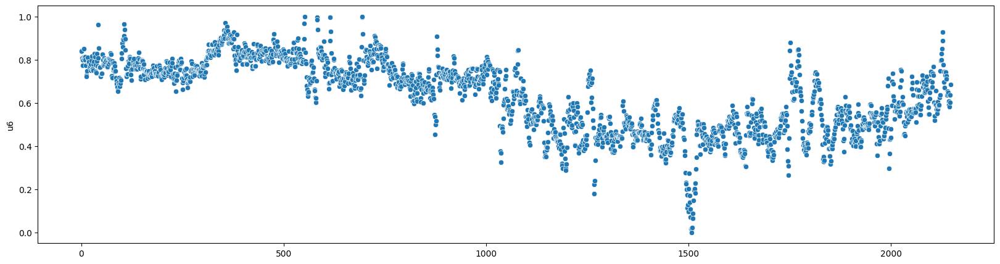

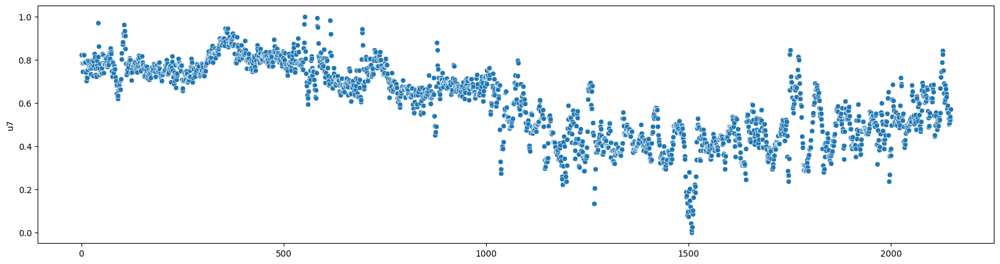

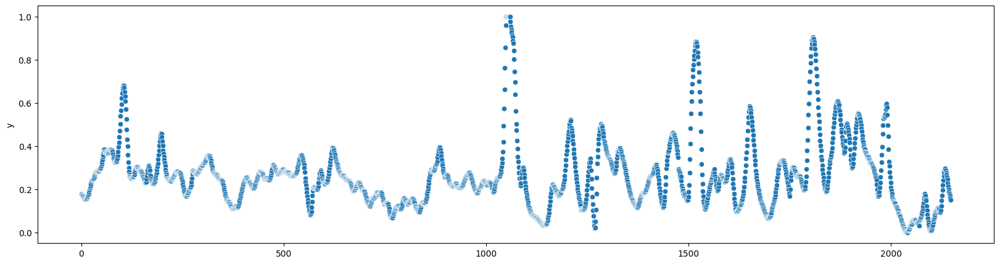

In [14]:
import seaborn as sns
feature_names=dataset['u1'],dataset['u2'],dataset['u3'],dataset['u4'],dataset['u5'],dataset['u6'],dataset['u7'],dataset['y'],
for feature in feature_names:
    plt.figure(figsize=(20, 5))
    sns.scatterplot(feature)

# Removing rows with 0

In [15]:
dataset = dataset[(dataset != 0).all(axis=1)]

In [16]:
dataset.describe()

,u1,u2,u3,u4,u5,u6,u7,y
count,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000
mean,0.280239,0.666802,0.595014,0.442033,0.660937,0.630609,0.599052,0.267540
std,0.099763,0.056397,0.193903,0.139322,0.126430,0.163659,0.172486,0.158065
min,0.008426,0.069706,0.001440,0.000282,0.001254,0.017502,0.025209,0.001196
25%,0.220837,0.652692,0.499936,0.363405,0.618796,0.491708,0.457691,0.171618
50%,0.259723,0.670519,0.623261,0.422771,0.697615,0.664111,0.627333,0.248400
75%,0.323743,0.690079,0.725745,0.525186,0.730318,0.761685,0.749826,0.316127
max,1.000000,0.911387,1.000000,1.000000,0.983421,1.000000,1.000000,1.000000


In [17]:
dataset = dataset.reset_index(drop = True)

In [18]:
dataset.describe()

,u1,u2,u3,u4,u5,u6,u7,y
count,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000,2140.000000
mean,0.280239,0.666802,0.595014,0.442033,0.660937,0.630609,0.599052,0.267540
std,0.099763,0.056397,0.193903,0.139322,0.126430,0.163659,0.172486,0.158065
min,0.008426,0.069706,0.001440,0.000282,0.001254,0.017502,0.025209,0.001196
25%,0.220837,0.652692,0.499936,0.363405,0.618796,0.491708,0.457691,0.171618
50%,0.259723,0.670519,0.623261,0.422771,0.697615,0.664111,0.627333,0.248400
75%,0.323743,0.690079,0.725745,0.525186,0.730318,0.761685,0.749826,0.316127
max,1.000000,0.911387,1.000000,1.000000,0.983421,1.000000,1.000000,1.000000


In [19]:
X = dataset.iloc[ : ,:-1].values
Y = dataset.iloc[ : ,-1].values

# Defining R2,SSE,AIC,BIC and graphs

In [20]:
def values(y_i,y_hat,k):
  from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
  r2=r2_score(y_i,y_hat)
  n=len(y_i)
  print('R2:',r2)
  SSE=mean_squared_error(y_hat,y_i)
  AIC = 2*k + n*(np.log(SSE/n))
  BIC = k*np.log(n) +n*np.log(2*math.pi) + n*np.log(SSE/n) + n
  print('SSE:',SSE)
  print('aic:',AIC)
  print('bic:',BIC)
  plt.plot(range(len(y_i)), y_i, label='Y_test')
  plt.plot(range(len(y_hat)), y_hat, label='y_pred')
  plt.legend()
  plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                      top=0.9, wspace=0.4, hspace=0.2)
  plt.show()

# Multivariate Regression

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 0)

### Training the Multiple Linear Regression model on the Training set

In [ ]:
from sklearn.linear_model import LinearRegression
regressor_mv = LinearRegression()
regressor_mv.fit(X_train, Y_train)

LinearRegression()

### Predicting the Test set results

In [ ]:
y_pred = regressor_mv.predict(X_test)
np.set_printoptions(precision = 2)
print(np.concatenate((y_pred.reshape(len(y_pred),1),Y_test.reshape(len(Y_test),1)),1))

[[0.16 0.14]
 [0.32 0.23]
 [0.38 0.34]
 ...
 [0.23 0.18]
 [0.33 0.14]
 [0.27 0.29]]


R2: 0.19621552738549508
SSE: 0.02085104919329748
aic: -6621.03104001935
bic: -4767.861845258721


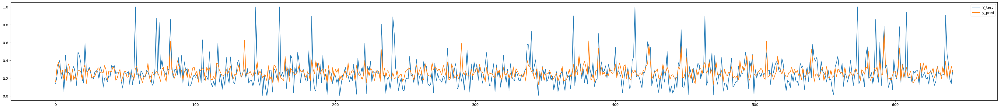

In [ ]:
values(Y_test,y_pred,7)

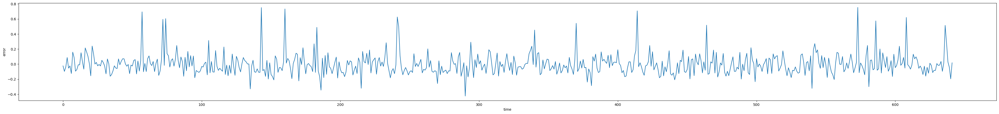

In [ ]:
e1=Y_test-y_pred
plt.plot(e1)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

In [ ]:
print("the value of B (Coefficients) is : ",regressor_mv.intercept_,regressor_mv.coef_)

the value of B (Coefficients) is :  0.6806088932548167 [ 0.49 -0.39 -0.1   0.23 -0.57 -0.72  0.83]


Text(0, 0.5, 'y_test')

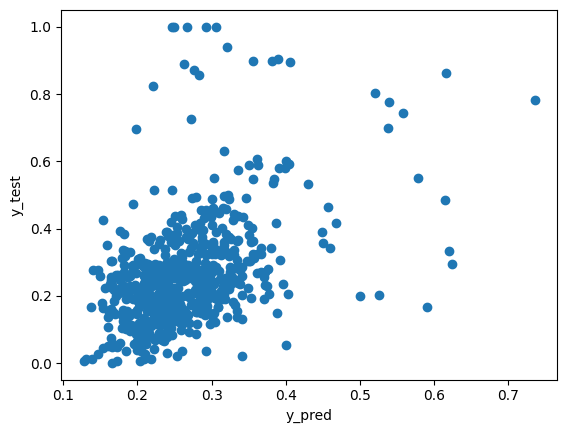

In [ ]:
plt.scatter(y_pred,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

# Regression Through Correlation Method

### Feature Selection

In [ ]:
dataset.corr()

,u1,u2,u3,u4,u5,u6,u7,y
u1,1.000000,-0.003559,0.178639,-0.299502,0.253589,-0.168947,-0.159809,0.078164
u2,-0.003559,1.000000,0.287118,-0.008256,0.030104,0.046861,0.009156,-0.218636
u3,0.178639,0.287118,1.000000,-0.121314,-0.044593,-0.323862,-0.381230,-0.221667
u4,-0.299502,-0.008256,-0.121314,1.000000,0.130514,0.337856,0.335081,0.132774
u5,0.253589,0.030104,-0.044593,0.130514,1.000000,0.681710,0.696205,-0.223299
u6,-0.168947,0.046861,-0.323862,0.337856,0.681710,1.000000,0.988149,-0.082795
u7,-0.159809,0.009156,-0.381230,0.335081,0.696205,0.988149,1.000000,-0.060681
y,0.078164,-0.218636,-0.221667,0.132774,-0.223299,-0.082795,-0.060681,1.000000


In [ ]:
X_FW = np.delete(X,[6],axis = 1)
print(X_FW)

[[0.27 0.65 0.83 0.58 0.78 0.84]
 [0.27 0.65 0.85 0.58 0.78 0.84]
 [0.27 0.66 0.82 0.57 0.76 0.81]
 ...
 [0.25 0.67 0.66 0.35 0.56 0.6 ]
 [0.23 0.67 0.68 0.35 0.53 0.64]
 [0.22 0.67 0.68 0.35 0.5  0.68]]


### Splitting data into training data and test data

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_FW,Y, test_size = 0.3, random_state = 0)

### Training the Multiple Linear Regression model on the Training set

In [ ]:
from sklearn.linear_model import LinearRegression
regressor_fs = LinearRegression()
regressor_fs.fit(X_train, Y_train)

LinearRegression()

### Predicting the Test set results

In [ ]:
y_pred = regressor_fs.predict(X_test)
np.set_printoptions(precision = 2)
print(np.concatenate((y_pred.reshape(len(y_pred),1),Y_test.reshape(len(Y_test),1)),1))

[[0.17 0.14]
 [0.31 0.23]
 [0.39 0.34]
 ...
 [0.23 0.18]
 [0.33 0.14]
 [0.27 0.29]]


R2: 0.20549594747693212
SSE: 0.020610304936032105
aic: -6632.486635883229
bic: -4788.246617729979


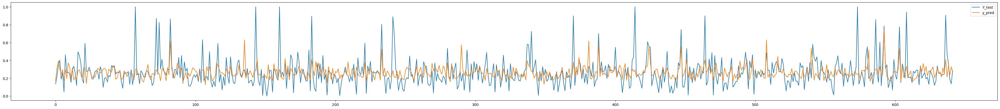

In [ ]:
values(Y_test,y_pred,5)

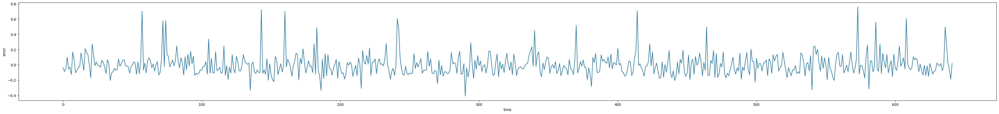

In [ ]:
e2=Y_test-y_pred
plt.plot(e2)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

In [ ]:
print("the value of B (Coefficients) is : ",regressor_fs.intercept_,regressor_fs.coef_)

the value of B (Coefficients) is :  0.677944861888319 [ 0.47 -0.43 -0.16  0.24 -0.49  0.09]


# Lasso regression

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 0)

In [ ]:
from sklearn.linear_model import Lasso
lasso_model = Lasso(alpha=1e-9)
lasso_model.fit(X_train, Y_train)

Lasso(alpha=1e-09)

In [ ]:
model_1=LinearRegression()

In [ ]:
model_1.fit(X_train,Y_train)

LinearRegression()

In [ ]:
y_pred_1=model_1.predict(X_test)

R2: 0.19621552738549508
SSE: 0.02085104919329748
aic: -6621.03104001935
bic: -4767.861845258721


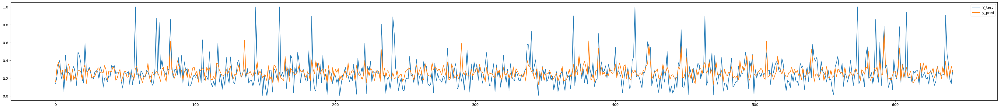

In [ ]:
values(Y_test,y_pred_1,7)

In [ ]:
y_pred = lasso_model.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1),Y_test.reshape(len(Y_test),1)),1))

[[0.16 0.14]
 [0.32 0.23]
 [0.38 0.34]
 ...
 [0.23 0.18]
 [0.33 0.14]
 [0.27 0.29]]


R2: 0.196215639925734
SSE: 0.020851046273880475
aic: -6621.031129907674
bic: -4767.861935147044


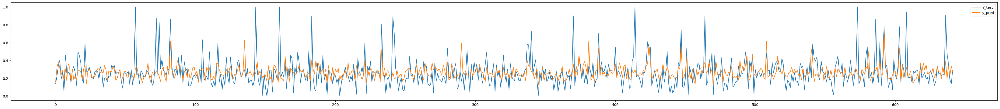

In [ ]:
values(Y_test,y_pred,7)

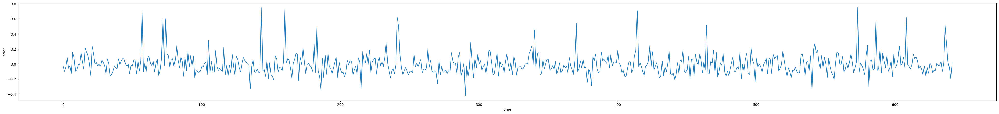

In [ ]:
e3=Y_test-y_pred
plt.plot(e3)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

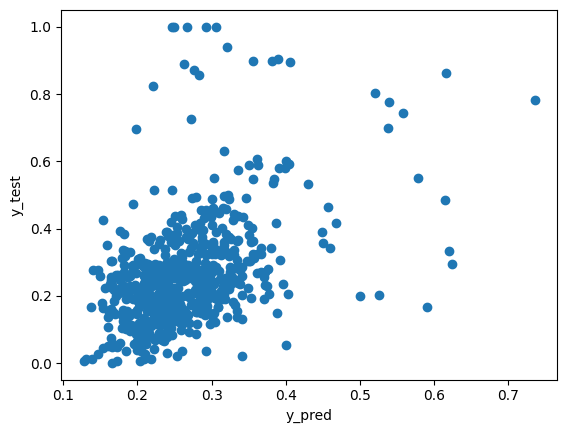

In [ ]:
plt.scatter(y_pred,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

In [ ]:
print("the value of B (Coefficients) is : ",lasso_model.intercept_,lasso_model.coef_)

the value of B (Coefficients) is :  0.68060871444599 [ 0.49 -0.39 -0.1   0.23 -0.57 -0.72  0.83]


# Polynomial Regression

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
poly_reg = PolynomialFeatures(degree = 3)
X_poly = poly_reg.fit_transform(X_train)
regressor = LinearRegression()
regressor.fit(X_poly, Y_train)

LinearRegression()

In [ ]:
y_pred = regressor.predict(poly_reg.transform(X_test))
np.set_printoptions(precision=2)
print(np.concatenate((y_pred.reshape(len(y_pred),1), Y_test.reshape(len(Y_test),1)),1))

[[ 0.11  0.14]
 [ 0.27  0.23]
 [ 0.4   0.34]
 [ 0.41  0.4 ]
 [ 0.2   0.19]
 [ 0.23  0.27]
 [ 0.16  0.05]
 [ 0.3   0.46]
 [ 0.29  0.26]
 [ 0.32  0.27]
 [ 0.31  0.25]
 [ 0.17  0.15]
 [ 0.26  0.29]
 [ 0.25  0.33]
 [ 0.27  0.26]
 [ 0.17  0.12]
 [ 0.37  0.49]
 [ 0.35  0.45]
 [ 0.23  0.37]
 [ 0.17  0.19]
 [ 0.31  0.15]
 [ 0.46  0.59]
 [ 0.25  0.28]
 [ 0.34  0.28]
 [ 0.22  0.32]
 [ 0.29  0.27]
 [ 0.17  0.19]
 [ 0.2   0.19]
 [ 0.2   0.27]
 [ 0.3   0.28]
 [ 0.29  0.28]
 [ 0.35  0.19]
 [ 0.22  0.33]
 [ 0.28  0.28]
 [ 0.15  0.1 ]
 [ 0.2   0.2 ]
 [ 0.24  0.21]
 [ 0.16  0.16]
 [ 0.3   0.23]
 [ 0.25  0.22]
 [ 0.31  0.34]
 [ 0.37  0.32]
 [ 0.29  0.34]
 [ 0.36  0.25]
 [ 0.13  0.27]
 [ 0.24  0.26]
 [ 0.22  0.27]
 [ 0.17  0.16]
 [ 0.22  0.09]
 [ 0.24  0.26]
 [ 0.26  0.25]
 [ 0.3   0.26]
 [ 0.16  0.27]
 [ 0.23  0.13]
 [ 0.3   0.3 ]
 [ 0.19  0.13]
 [ 0.29  0.23]
 [ 0.43  1.  ]
 [ 0.3   0.24]
 [ 0.31  0.26]
 [ 0.24  0.14]
 [ 0.21  0.28]
 [ 0.25  0.26]
 [ 0.35  0.21]
 [ 0.3   0.21]
 [ 0.26  0.29]
 [ 0.4   0

R2: 0.43384001367562086
SSE: 0.014308865888727457
aic: -4396.9676307195205
bic: -3153.942383927248


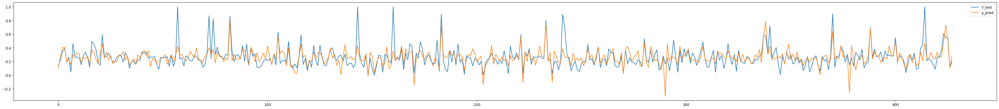

In [ ]:
values(Y_test,y_pred,7)

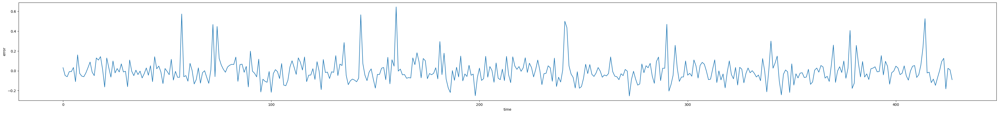

In [ ]:
e4=Y_test-y_pred
plt.plot(e4)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

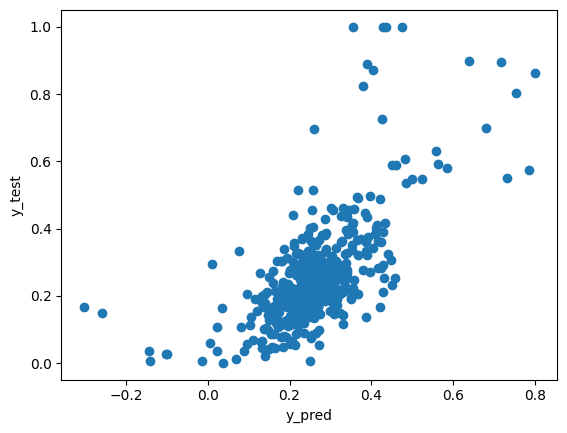

In [ ]:
plt.scatter(y_pred,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

# PCA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(0.93)
X_PCA = pca.fit_transform(X)
print(X_PCA)
X_PCA.shape

[[ 0.23  0.35  0.1  -0.02]
 [ 0.22  0.36  0.1  -0.03]
 [ 0.18  0.32  0.1  -0.02]
 ...
 [-0.14 -0.   -0.02 -0.1 ]
 [-0.12  0.01 -0.   -0.13]
 [-0.08  0.01  0.01 -0.17]]


(2140, 4)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_PCA,Y, test_size = 0.3, random_state = 0)

### Training the Multiple Linear Regression model on the Training set

In [ ]:
from sklearn.linear_model import LinearRegression
regressor_mv = LinearRegression()
regressor_mv.fit(X_train, Y_train)
poly_reg = PolynomialFeatures(degree = 3)
X_poly = poly_reg.fit_transform(X_train)
regressor = LinearRegression()
regressor.fit(X_poly, Y_train)

LinearRegression()

### Predicting the Test set results

In [ ]:
y_pred_mv = regressor_mv.predict(X_test)
np.set_printoptions(precision = 2)
print(np.concatenate((y_pred_mv.reshape(len(y_pred_mv),1),Y_test.reshape(len(Y_test),1)),1))
y_pred_ply = regressor.predict(poly_reg.transform(X_test))
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_ply.reshape(len(y_pred_ply),1), Y_test.reshape(len(Y_test),1)),1))

[[0.22 0.14]
 [0.35 0.23]
 [0.29 0.34]
 ...
 [0.28 0.18]
 [0.33 0.14]
 [0.28 0.29]]
[[0.15 0.14]
 [0.3  0.23]
 [0.54 0.34]
 ...
 [0.27 0.18]
 [0.31 0.14]
 [0.26 0.29]]


R2: 0.10777080806432149
SSE: 0.023145402040715125
aic: -6558.011455079442
bic: -4713.771436926193


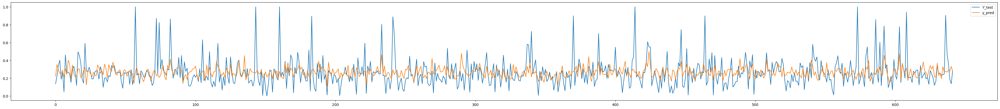

R2: 0.2983514628040509
SSE: 0.018201531211333253
aic: -6712.277905887243
bic: -4868.037887733994


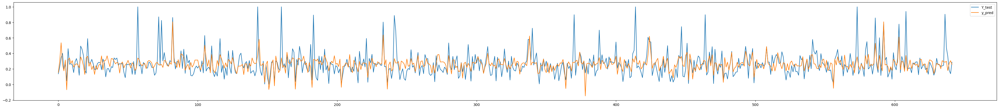

In [ ]:
values(Y_test,y_pred_mv,5)
values(Y_test,y_pred_ply,5)

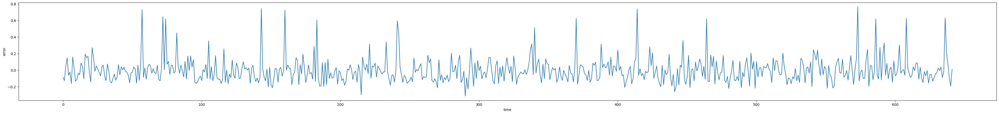

In [ ]:
e5=Y_test-y_pred_mv
plt.plot(e5)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

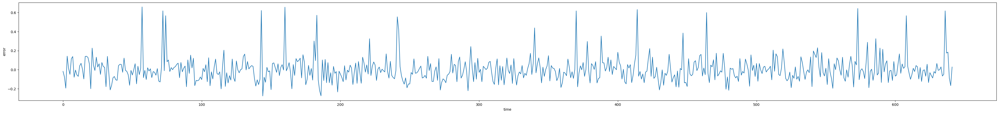

In [ ]:
e6=Y_test-y_pred_ply
plt.plot(e6)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

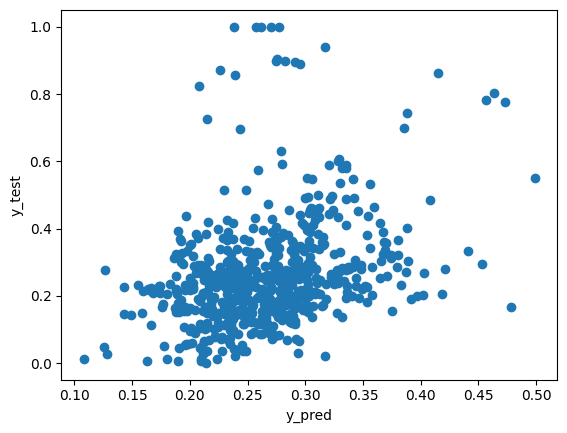

In [ ]:
plt.scatter(y_pred_mv,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

Text(0, 0.5, 'y_test')

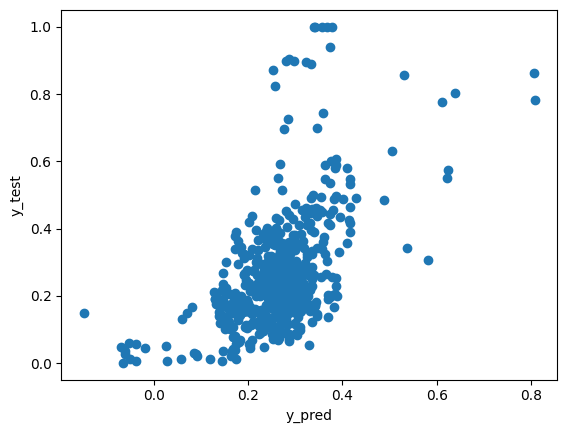

In [ ]:
plt.scatter(y_pred_ply,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

In [ ]:
print("the value of B (Coefficients) is : ",regressor_mv.intercept_,regressor_mv.coef_)

the value of B (Coefficients) is :  0.26792288707441364 [-0.01 -0.25  0.11  0.3 ]


# **NEURAL NETWORKS**

# Forward propogation

In [ ]:
X = dataset.iloc[ : ,0:-1].values
Y = dataset.iloc[ : ,-1].values

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 0)

In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential ,regularizers
from tensorflow.keras.layers import Dense

Model

In [ ]:
model=Sequential([
    Dense(units=len(X[1]), activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=70, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=1)
])

Loss and Cost

In [ ]:
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import Adam
model.compile(optimizer='adam',loss=MeanSquaredError())

Training data

In [ ]:
history=model.fit(X_train,Y_train,epochs=1000,validation_split=0.3)

Epoch 1/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0585 - val_loss: 0.0291
Epoch 2/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0362 - val_loss: 0.0265
Epoch 3/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0302 - val_loss: 0.0246
Epoch 4/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0305 - val_loss: 0.0231
Epoch 5/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0254 - val_loss: 0.0222
Epoch 6/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0271 - val_loss: 0.0213
Epoch 7/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0254 - val_loss: 0.0207
Epoch 8/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0231 - val_loss: 0.0210
Epoch 9/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0217 - val_loss: 0.0202
Epoch 10/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0254 - val_loss: 0.0201
Epoch 11/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0226 - val_loss: 0.0199
Epoch 12/1000
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/ste

Text(0, 0.5, 'Losses')

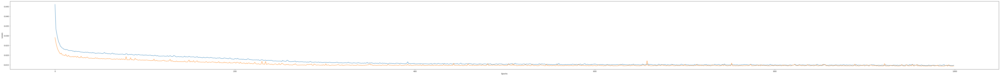

In [ ]:
plt.figure(figsize =(100,7))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.xlabel("Epochs")
plt.ylabel("Losses")

In [ ]:
y_pred_nn=model.predict(X_test)

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


R2: 0.49220011864135493
SSE: 0.01317288485571158
aic: -6915.86551385891
bic: -5062.696319098281


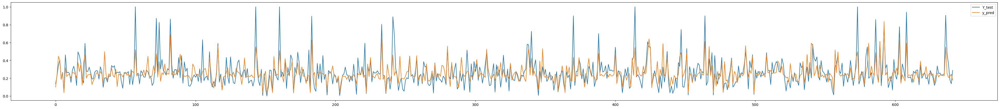

In [ ]:
values(Y_test,y_pred_nn,7)

In [ ]:
y_pred=y_pred_nn.reshape(-1,)

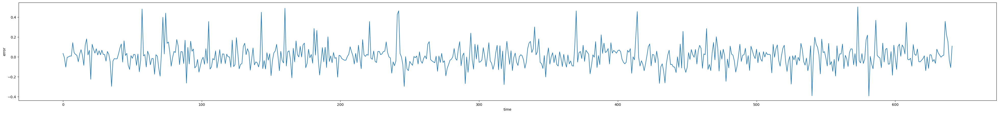

In [ ]:
e7=Y_test-y_pred
plt.plot(e7)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

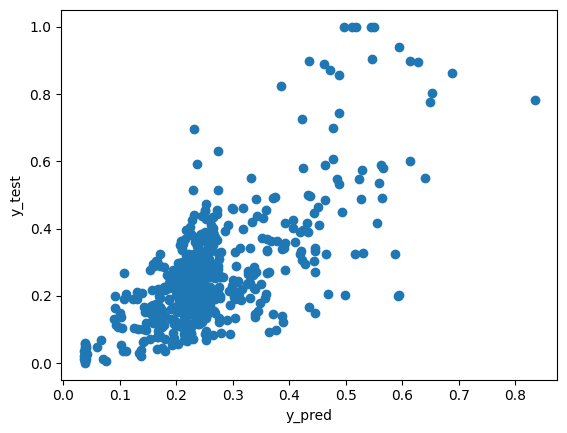

In [ ]:
plt.scatter(y_pred_nn,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

# Multi layer neural network

In [ ]:
X = dataset.iloc[ : ,0:-1].values
Y = dataset.iloc[ : ,-1].values

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 0)

In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential ,regularizers
from tensorflow.keras.layers import Dense

Model

In [ ]:
model=Sequential([
    Dense(units=7, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=50, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=50, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=50, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=50, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=50, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=50, activation='relu',kernel_regularizer=regularizers.l1(0.0001)),
    Dense(units=1)
])

Loss and Cost

In [ ]:
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import Adam
model.compile(optimizer='adam',loss=MeanSquaredError())

Training data

In [ ]:
history=model.fit(X_train,Y_train,epochs=500,validation_split=0.3,batch_size=18)

Epoch 1/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2029 - val_loss: 0.1335
Epoch 2/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.1297 - val_loss: 0.0943
Epoch 3/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0941 - val_loss: 0.0692
Epoch 4/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0670 - val_loss: 0.0546
Epoch 5/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0582 - val_loss: 0.0508
Epoch 6/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0528 - val_loss: 0.0466
Epoch 7/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0509 - val_loss: 0.0441
Epoch 8/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0501 - val_loss: 0.0419
Epoch 9/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0476 - val_loss: 0.0414
Epoch 10/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0462 - val_loss: 0.0385
Epoch 11/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0415 - val_loss: 0.0376
Epoch 12/500
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0

Text(0, 0.5, 'Losses')

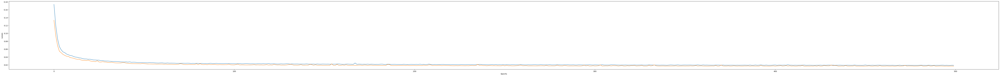

In [ ]:
plt.figure(figsize =(100,7))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.xlabel("Epochs")
plt.ylabel("Losses")

In [ ]:
y_pred_nn=model.predict(X_test)

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


In [ ]:
y_pred=y_pred_nn.reshape(-1,)

R2: 0.4395620205623977
SSE: 0.014538374747443223
aic: -6852.544316490101
bic: -4999.375121729471


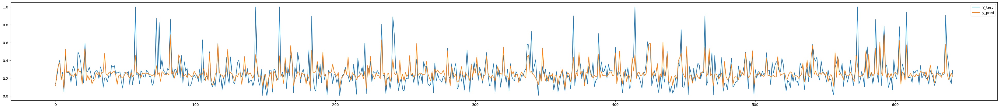

In [ ]:
values(Y_test,y_pred_nn,7)

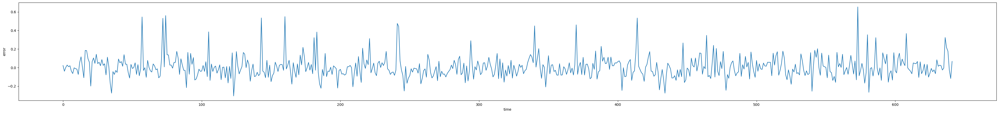

In [ ]:
e8=Y_test-y_pred
plt.plot(e8)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

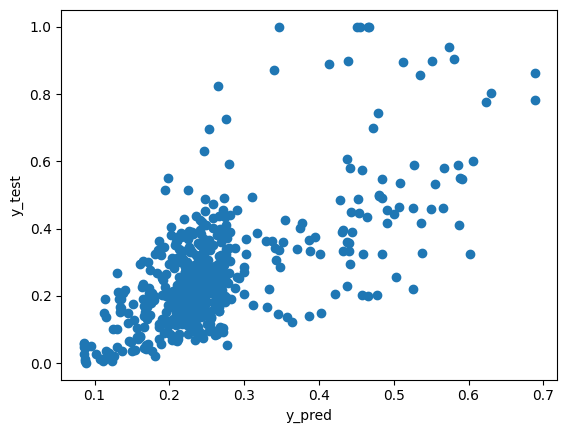

In [ ]:
plt.scatter(y_pred_nn,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

# LSTM

In [21]:
X = dataset.iloc[ : ,:-1].values
Y = dataset.iloc[ : ,-1].values

Epoch 1/3500


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Streaming output truncated to the last 5000 lines.
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0014 - val_loss: 0.0091
Epoch 1004/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0016 - val_loss: 0.0087
Epoch 1005/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0016 - val_loss: 0.0094
Epoch 1006/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0017 - val_loss: 0.0089
Epoch 1007/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 0.0088
Epoch 1008/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0019 - val_loss: 0.0092
Epoch 1009/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0013 - val_loss: 0.0087
Epoch 1010/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0014 - val_loss: 0.0087
Epoch 1011/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0011 - val_loss: 0.0089
Epoch 1012/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0014 - val_loss: 0.0090
Epoch 1013/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0015 - val

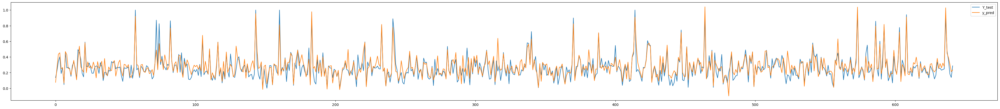

In [22]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping


# Split the data into training and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,  random_state = 0)

# Reshape the input data for LSTM
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential([
LSTM(64,return_sequences=True, input_shape=(1, X_train.shape[2])),
LSTM(64, activation='relu'),
Dense(32,activation ='relu'),
Dense(1)
])
# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
#early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=3500, validation_split = 0.3 )

y_pred_lstm = model.predict(X_test)

values(y_test,y_pred_lstm,7)

642


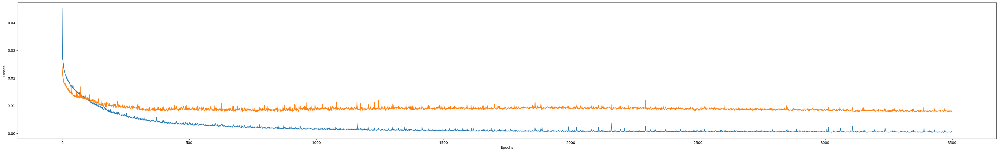

In [23]:
plt.figure(figsize =(50,7))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.xlabel("Epochs")
plt.ylabel("Losses")
print(len(X_test))

R2: 0.7379969048274263
SSE: 0.006796647126647853
aic: -7340.696891811041
bic: -5487.527697050411


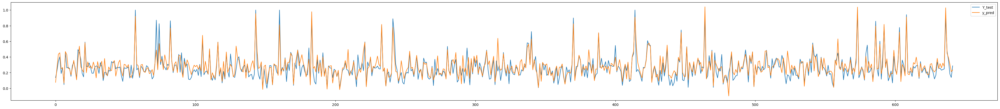

In [24]:
values(y_test,y_pred_lstm,7)
np.save('y_pred_lstm.npy', y_pred_lstm)  # Save as NumPy file

In [25]:
y_pred=y_pred_lstm.reshape(-1,)

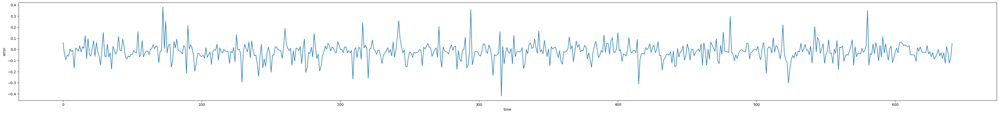

In [26]:
e9=y_test-y_pred
plt.plot(e9)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

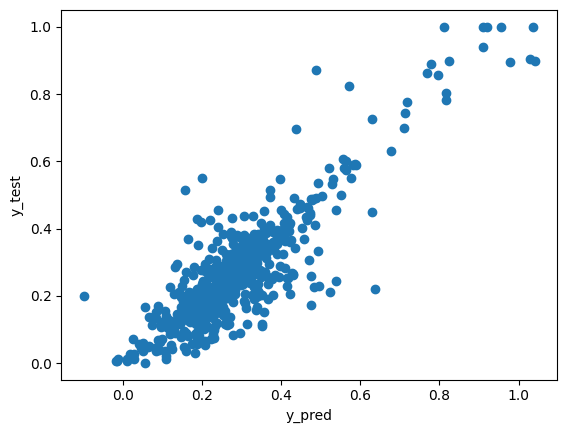

In [27]:
plt.scatter(y_pred,y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

# RNN

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN
from sklearn.model_selection import train_test_split

# Load your dataset
# Assuming your dataset is in numpy arrays named 'X' and 'y'
# with shapes (2994, 7) and (2994, 1) respectively

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size=0.3, random_state=0)

# Reshape the input data for RNN
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

# Define the RNN model
model = Sequential()
model.add(SimpleRNN(64, return_sequences=True , input_shape=(1, X_train.shape[2])))
model.add(SimpleRNN(32) )  # Additional RNN layer
model.add(Dense(16, activation='relu'))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val))

# Predict on the validation data
y_val_pred = model.predict(X_val)

Epoch 1/1000


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0309 - val_loss: 0.0254
Epoch 2/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0227 - val_loss: 0.0231
Epoch 3/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0269 - val_loss: 0.0219
Epoch 4/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0209 - val_loss: 0.0238
Epoch 5/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0216 - val_loss: 0.0208
Epoch 6/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0196 - val_loss: 0.0202
Epoch 7/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0211 - val_loss: 0.0199
Epoch 8/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0183 - val_loss: 0.0223
Epoch 9/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0197 - val_loss: 0.0189
Epoch 10/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0186 - val_loss: 0.0189
Epoch 11/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0179 - val_loss: 0.0210
Epoch 12/1000
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0

In [ ]:
y_pred=y_val_pred.reshape(-1,)

R2: 0.6981248346940827
SSE: 0.007830972277374773
aic: -7249.7529343085125
bic: -5396.583739547883


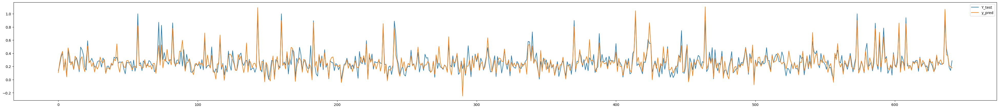

In [ ]:
values(y_test,y_pred,7)

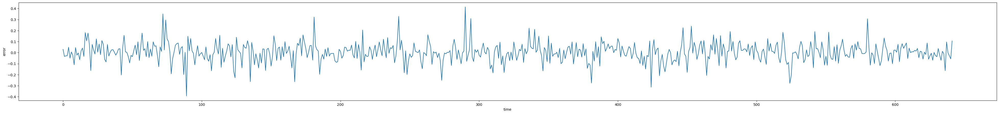

In [ ]:
e10= (Y_test-y_pred)
plt.plot(e10)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

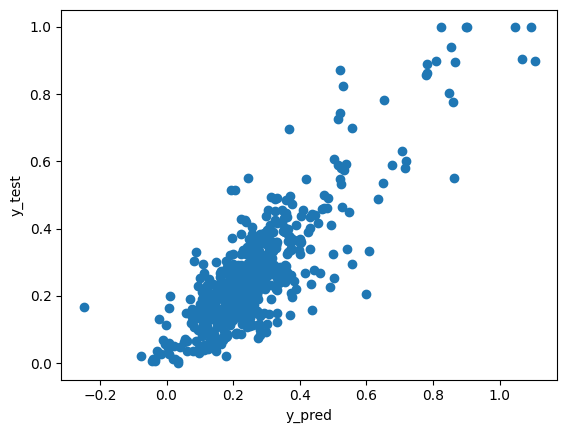

In [ ]:
plt.scatter(y_val_pred,Y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

# KNN

R2: 0.7549579305045256
SSE: 0.005641635342126907
aic: -7460.2728863541
bic: -5607.10369159347


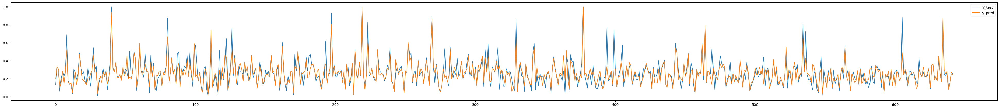

In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split



# Split the data into training and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

# Create a KNN regressor object
knn = KNeighborsRegressor(n_neighbors=3)

# Train the KNN model
history = knn.fit(X_train, y_train.ravel())

# Predict on the validation data
y_pred = knn.predict(X_test)
values(y_test,y_pred,7)

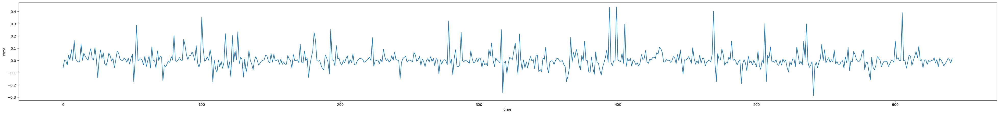

In [ ]:
e11=y_test-y_pred
plt.plot(e11)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

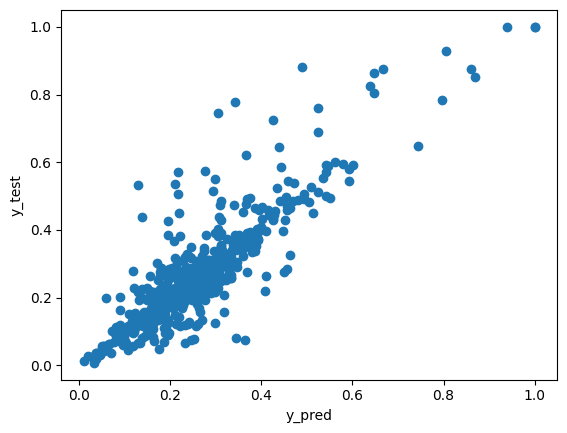

In [ ]:
plt.scatter(y_pred,y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

R2: 0.752515789354799
SSE: 0.005697861074504728
aic: -7457.90625159583
bic: -5613.666233442581


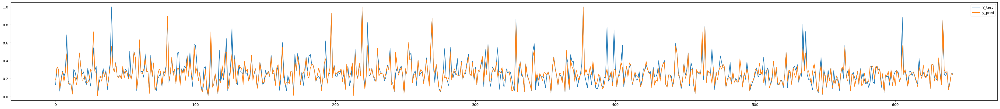

In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size=0.3, random_state=42)

# Create a PolynomialFeatures object
poly = PolynomialFeatures(degree=2)  # Set the desired degree

# Transform the training and validation data with polynomial features
X_train_poly = poly.fit_transform(X_train)
X_val_poly = poly.transform(X_val)

# Create a KNN regressor object
knn = KNeighborsRegressor(n_neighbors=2)

# Train the KNN model with polynomial features
knn.fit(X_train_poly, y_train.ravel())

# Predict on the validation data
y_val_pred = knn.predict(X_val_poly)
values(y_val,y_val_pred,5)

# Bi-directional LSTM

In [ ]:
X = dataset.iloc[ : ,:-1].values
Y = dataset.iloc[ : ,-1].values

Epoch 1/3500


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Streaming output truncated to the last 5000 lines.
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 8.4897e-04 - val_loss: 0.0051
Epoch 1004/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 6.1847e-04 - val_loss: 0.0054
Epoch 1005/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 6.1113e-04 - val_loss: 0.0052
Epoch 1006/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 9.0483e-04 - val_loss: 0.0054
Epoch 1007/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.1354e-04 - val_loss: 0.0055
Epoch 1008/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0012 - val_loss: 0.0058
Epoch 1009/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.5391e-04 - val_loss: 0.0055
Epoch 1010/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.4943e-04 - val_loss: 0.0054
Epoch 1011/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 8.5057e-04 - val_loss: 0.0054
Epoch 1012/3500
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 8.4895e-04 - val_loss: 0.0054
Epoch 1013/3500
33/33 ━━━━━━━

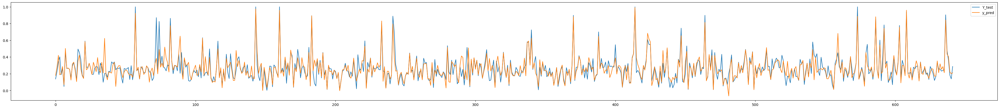

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense, Bidirectional
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam


# Split the data into training and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,  random_state = 0)

# Reshape the input data for LSTM
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define the LSTM model
model = Sequential([
    Bidirectional(LSTM(64, return_sequences = True ,input_shape=(1, X_train.shape[2]))),
    Bidirectional(LSTM(64, activation='relu'),),
    Dense(64, activation='relu'),
    Dense(1)
])

# Compile the model
#optimizer = Adam(learning_rate = 0.001)
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=3500, validation_split = 0.3)

y_pred_bi = model.predict(X_test)

values(y_test,y_pred_bi,7)

642


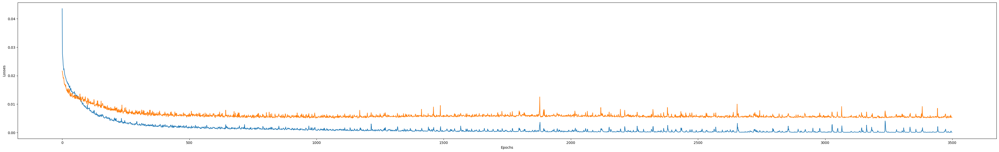

In [ ]:
plt.figure(figsize =(50,7))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.xlabel("Epochs")
plt.ylabel("Losses")
print(len(X_test))

R2: 0.766886385429968
SSE: 0.006047222371958284
aic: -7415.701987057261
bic: -5562.532792296632


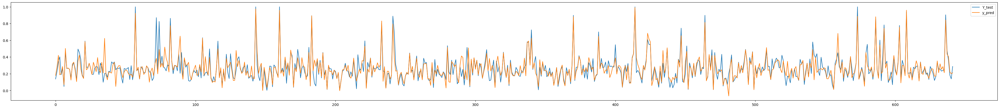

In [ ]:
values(y_test,y_pred_bi,7)
np.save('y_pred_bi.npy', y_pred_bi)  # Save as NumPy file

In [ ]:
y_pred_bi=y_pred_bi.reshape(-1,)

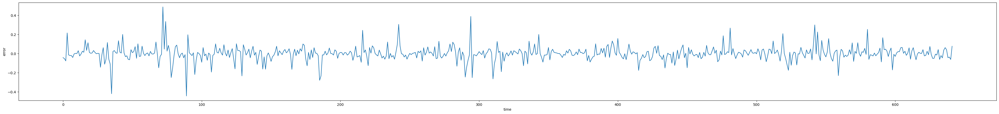

In [ ]:
e9=y_test-y_pred_bi
plt.plot(e9)
plt.xlabel('time')
plt.ylabel('error')
plt.subplots_adjust(left=0.01, bottom=0.1, right=6,
                    top=0.9, wspace=0.4,hspace=0.2)
plt.show()

Text(0, 0.5, 'y_test')

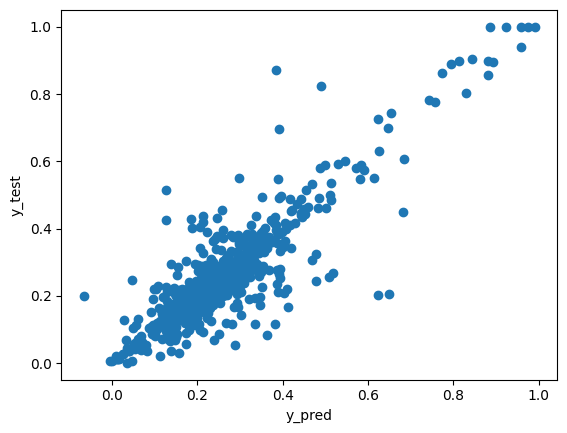

In [ ]:
plt.scatter(y_pred_bi,y_test, marker='o')
plt.xlabel('y_pred')
plt.ylabel('y_test')

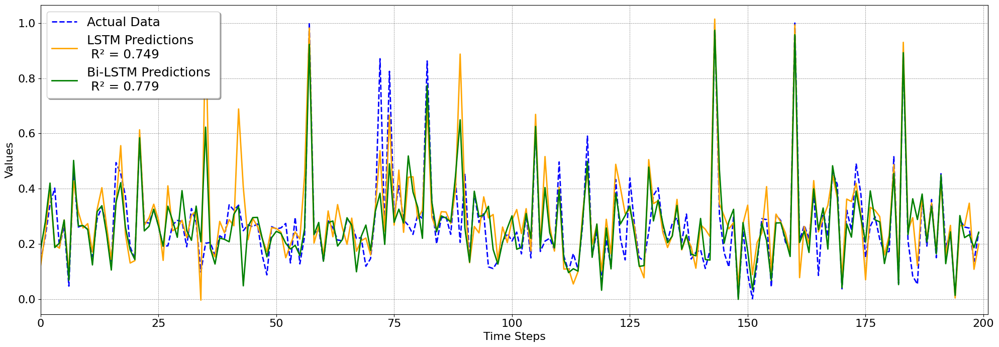

In [ ]:
import matplotlib.pyplot as plt
# Assuming y_test is the actual data, and y_pred_lstm and y_pred_bilstm are the predictions from LSTM and BiLSTM models respectively.
np.save('y_test.npy', y_test)  # Save as NumPy file
y_test = np.load('y_test.npy')
y_pred_lstm = np.load('y_pred_lstm.npy')
y_pred_bi = np.load('y_pred_bi.npy')


# Plot the results
plt.figure(figsize=(20, 7))  # Adjusted size for better visualization
plt.plot(y_test[0:200], label='Actual Data', color='blue', linestyle='dashed', linewidth=2)
plt.plot(y_pred_lstm[0:200], label='LSTM Predictions \n R² = 0.749', color='orange', linestyle='solid', linewidth=2)
plt.plot(y_pred_bi[0:200], label='Bi-LSTM Predictions \n R² = 0.779', color='green', linestyle='solid', linewidth=2)

# Add labels, legend, and title
plt.xlabel('Time Steps', fontsize=16)
plt.ylabel('Values', fontsize=16)
#plt.title('Comparison of LSTM and Bi-LSTM Predictions Against Actual Data', fontsize=20, fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=16)
plt.legend(fontsize=18, loc='upper left', frameon=True, shadow=True)
plt.grid(color='gray', linestyle='--', linewidth=0.5)  # Add grid for better readability

plt.xlim(0, 201)  # Adjust 0 and max index as needed
# Adjust layout and save the plot
plt.tight_layout()
plt.savefig("graph.png", dpi=300, bbox_inches='tight')  # High-resolution output
plt.show()

# LLM

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, LayerNormalization, MultiHeadAttention, Conv1D, GlobalAveragePooling1D
from tensorflow.keras.optimizers import Adam

def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        seq = data[i:i+seq_length]
        sequences.append(seq)
    return np.array(sequences)





data = dataset.values
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Create sequences
seq_length = 30  # Number of time steps to look back
X = create_sequences(data_scaled[:, :-1], seq_length)
Y = data_scaled[seq_length:, -1]

# Split into train and test sets
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
Y_train, Y_test = Y[:split], Y[split:]

# Define the model
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = LayerNormalization(epsilon=1e-6)(inputs)
    x = MultiHeadAttention(key_dim=head_size, num_heads=num_heads, dropout=dropout)(x, x)
    x = Dropout(dropout)(x)
    res = x + inputs

    x = LayerNormalization(epsilon=1e-6)(res)
    x = Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = Dropout(dropout)(x)
    x = Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    return x + res

def build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0,
):
    inputs = Input(shape=input_shape)
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    outputs = Dense(1)(x)
    return Model(inputs, outputs)

model = build_model(
    input_shape=(seq_length, 7),  # 7 input variables
    head_size=256,
    num_heads=4,
    ff_dim=8,
    num_transformer_blocks=2,
    mlp_units=[128, 64],
    mlp_dropout=0.25,
    dropout=0.25,
)

# Compile the model
optimizer = Adam(learning_rate = 0.001)
model.compile(optimizer=optimizer, loss='mse')

# Train the model
history = model.fit(
    X_train, Y_train,
    epochs=70,
    batch_size=64,
    validation_split=0.3,
    verbose=1
)


# Get the last sequence from the training data
last_sequence = X_train[-1]



Epoch 1/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 15s 271ms/step - loss: 0.7832 - val_loss: 0.6166
Epoch 2/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 337ms/step - loss: 0.3068 - val_loss: 0.6206
Epoch 3/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.2087 - val_loss: 0.5349
Epoch 4/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 337ms/step - loss: 0.1681 - val_loss: 0.5302
Epoch 5/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - loss: 0.1269 - val_loss: 0.5632
Epoch 6/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 314ms/step - loss: 0.1173 - val_loss: 0.6012
Epoch 7/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 318ms/step - loss: 0.1054 - val_loss: 0.6137
Epoch 8/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - loss: 0.1187 - val_loss: 0.5805
Epoch 9/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 337ms/step - loss: 0.1074 - val_loss: 0.6675
Epoch 10/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0962 - val_loss: 0.7007
Epoch 11/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 264ms/step - loss: 0.0952 - val_loss: 0.6402
Epoch 12/70
19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 286ms/st

14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 203ms/step
Mean Squared Error: 0.0474
Root Mean Squared Error: 0.2177
Mean Absolute Error: 0.1689
R-squared Score: -0.1745


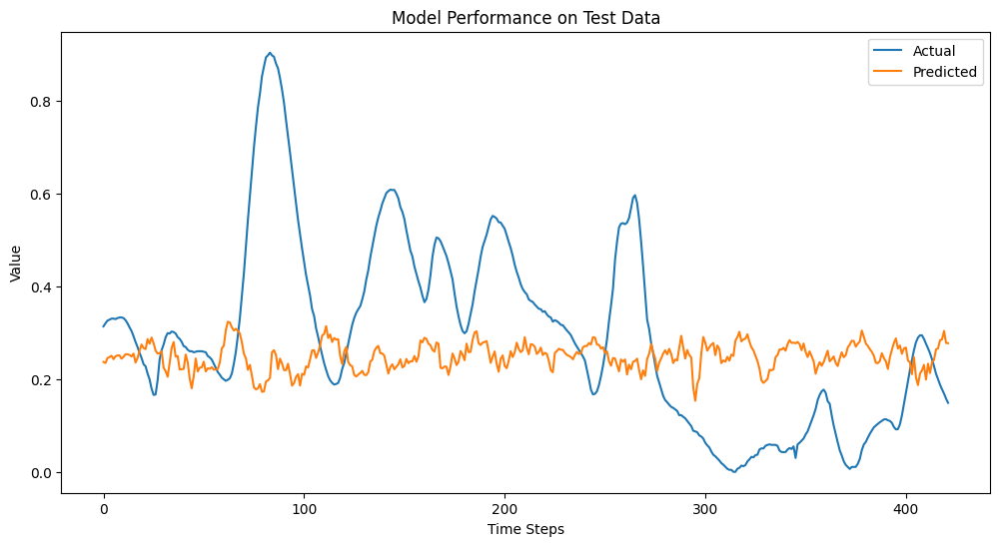

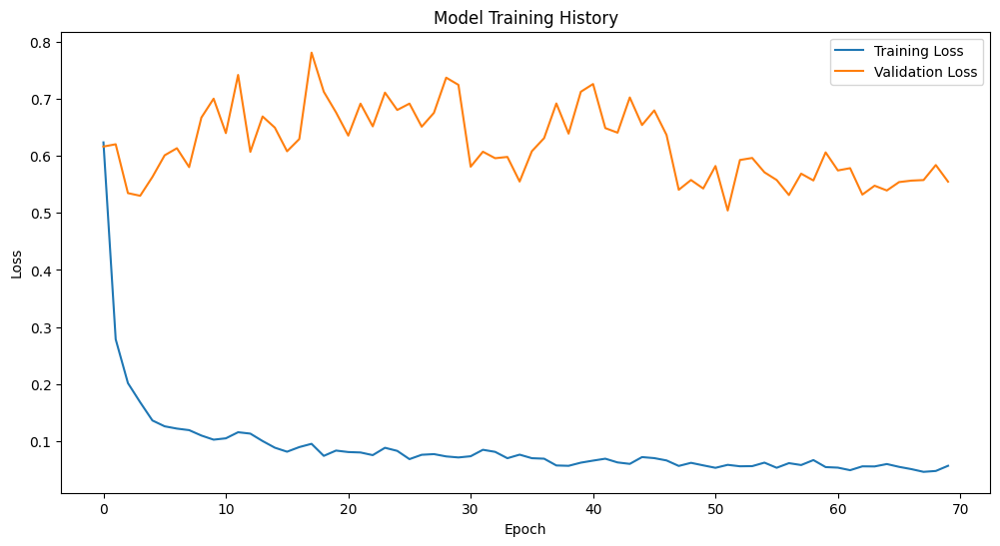

In [ ]:

# Make predictions on the test set
Y_pred = model.predict(X_test)

# Inverse transform predictions and actual values
Y_test_inv = scaler.inverse_transform(np.hstack([np.zeros((len(Y_test), 7)), Y_test.reshape(-1, 1)]))[:, -1]
Y_pred_inv = scaler.inverse_transform(np.hstack([np.zeros((len(Y_pred), 7)), Y_pred]))[:, -1]

# Calculate performance metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(Y_test_inv, Y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(Y_test_inv, Y_pred_inv)
r2 = r2_score(Y_test_inv, Y_pred_inv)

print(f"Mean Squared Error: {mse:.4f}")
print(f"Root Mean Squared Error: {rmse:.4f}")
print(f"Mean Absolute Error: {mae:.4f}")
print(f"R-squared Score: {r2:.4f}")

# Visualize the results
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(Y_test_inv, label='Actual')
plt.plot(Y_pred_inv, label='Predicted')
plt.title('Model Performance on Test Data')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.legend()
plt.show()

# Optionally, you can also plot the training history
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Training History')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

R2: 0.4583823633534658
SSE: 0.02185542593405296
aic: -4150.4274005889465
bic: -2924.5282413659506


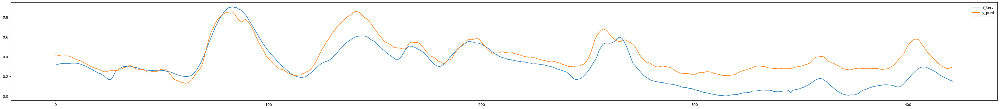

In [ ]:
values(Y_test_inv,Y_pred_inv,7)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, LayerNormalization, MultiHeadAttention, Conv1D, GlobalAveragePooling1D
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        seq = data[i:i+seq_length]
        sequences.append(seq)
    return np.array(sequences)

# Assuming 'dataset' is your input data
data = dataset.values
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Create sequences
seq_length = 30  # Number of time steps to look back
X = create_sequences(data_scaled[:, :-1], seq_length)
Y = data_scaled[seq_length:, -1]

# Split into train and test sets
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
Y_train, Y_test = Y[:split], Y[split:]

def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = LayerNormalization(epsilon=1e-6)(inputs)
    x = MultiHeadAttention(key_dim=head_size, num_heads=num_heads, dropout=dropout)(x, x)
    x = Dropout(dropout)(x)
    res = x + inputs

    x = LayerNormalization(epsilon=1e-6)(res)
    x = Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = Dropout(dropout)(x)
    x = Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    return x + res

def build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0,
):
    inputs = Input(shape=input_shape)
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    outputs = Dense(1)(x)
    return Model(inputs, outputs)

model = build_model(
    input_shape=(seq_length, 7),  # 7 input variables
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128, 64],
    mlp_dropout=0.4,
    dropout=0.25,
)

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mse')

# Train the model
history = model.fit(
    X_train, Y_train,
    epochs=80,
    batch_size=64,
    validation_split=0.2,
    verbose=1
)

# Make predictions on the test set
Y_pred = model.predict(X_test)

# Inverse transform predictions and actual values
Y_test_inv = scaler.inverse_transform(np.hstack([np.zeros((len(Y_test), 7)), Y_test.reshape(-1, 1)]))[:, -1]
Y_pred_inv = scaler.inverse_transform(np.hstack([np.zeros((len(Y_pred), 7)), Y_pred]))[:, -1]

# Calculate performance metrics
mse = mean_squared_error(Y_test_inv, Y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(Y_test_inv, Y_pred_inv)
r2 = r2_score(Y_test_inv, Y_pred_inv)

print(f"Mean Squared Error: {mse:.4f}")
print(f"Root Mean Squared Error: {rmse:.4f}")
print(f"Mean Absolute Error: {mae:.4f}")
print(f"R-squared Score: {r2:.4f}")

Epoch 1/80


KeyboardInterrupt: 

# Transformers

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from transformers import BertModel, BertTokenizer, AdamW
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

X = dataset.iloc[ : ,:-1].values
Y = dataset.iloc[ : ,-1].values

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Convert the data into tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)  # Unsqueeze for 1 output variable

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

# Create DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Define the Transformer model
class TransformerModel(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=128, nhead=1, num_encoder_layers=2):
        super(TransformerModel, self).__init__()
        self.transformer = nn.Transformer(input_dim, nhead, num_encoder_layers, num_encoder_layers)
        self.fc = nn.Linear(input_dim, hidden_dim)
        self.output_layer = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = x.unsqueeze(1)  # Add sequence dimension for transformer
        transformer_out = self.transformer(x, x)
        transformer_out = transformer_out.squeeze(1)  # Remove sequence dimension
        hidden_out = torch.relu(self.fc(transformer_out))
        output = self.output_layer(hidden_out)
        return output

# Initialize the model, loss function, and optimizer
model = TransformerModel(input_dim=7, output_dim=1)
criterion = nn.MSELoss()  # Use appropriate loss for your task (e.g., MSE for regression)
optimizer = AdamW(model.parameters(), lr=0.001)

# Training loop
num_epochs = 600
train_losses = []
val_losses = []
for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()
        predictions = model(X_batch)
        loss = criterion(predictions, y_batch)
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

    # Average training loss for the epoch
    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation phase
    model.eval()
    total_val_loss = 0
    predictions_list = []
    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            predictions = model(X_batch)
            val_loss = criterion(predictions, y_batch)
            total_val_loss += val_loss.item()
            predictions_list.append(predictions)

    # Average validation loss for the epoch
    avg_val_loss = total_val_loss / len(test_loader)
    val_losses.append(avg_val_loss)



    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss}, Val Loss: {avg_val_loss}")


# Evaluation
model.eval()
predictions_list = []
with torch.no_grad():
    total_loss = 0
    for X_batch, y_batch in test_loader:
        predictions = model(X_batch)
        loss = criterion(predictions, y_batch)
        total_loss += loss.item()
        predictions_list.append(predictions)

    print(f"Test Loss: {total_loss/len(test_loader)}")

# Convert list of predictions to a tensor
y_pred_tensor = torch.cat(predictions_list, dim=0)
y_pred = y_pred_tensor.numpy()

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Training Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Convergence')
plt.legend()
plt.show()


In [ ]:
values(y_test,y_pred,7)